In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import sys
sys.path.insert(1,'../../satellite_collocation/')
import os
import numpy as np
import general_collocation as gc
import instrument_reader as ir
import satellite_geo as sg

import glob
import datetime
from datetimerange import DateTimeRange
import h5py

from netCDF4 import Dataset

import warnings
warnings.filterwarnings("ignore")

import argparse
import string

In [3]:
def Solar_Calculate(xlon, xlat, jday, tu):
    pi = 3.14159265
    dtor = pi / 180.0                         # change degree to radians
    
    tsm = tu + xlon/15.0                      # mean solar time
    xlo = xlon*dtor
    xla = xlat*dtor
    xj = jday
    
    a1 = (1.00554*xj - 6.28306)  * dtor
    a2 = (1.93946*xj + 23.35089) * dtor
    et = -7.67825*np.sin(a1) - 10.09176*np.sin(a2)             #time equation
    
    tsv = tsm + et/60.0 
    tsv = tsv - 12.0                                    # true solar time
    
    ah = tsv*15.0*dtor                                 # hour angle
    
    a3 = (0.9683*xj - 78.00878) * dtor
    delta = 23.4856*np.sin(a3)* dtor                    # solar declination (in radian)

    cos_delta = np.cos(delta)
    sin_delta = np.sin(delta)
    cos_ah = np.cos(ah)
    sin_xla = np.sin(xla)
    cos_xla = np.cos(xla)
    
    
    amuzero = sin_xla*sin_delta + cos_xla*cos_delta*cos_ah
    elev = np.arcsin(amuzero)
    cos_elev = np.cos(elev)
    az = cos_delta*np.sin(ah)/cos_elev
    caz = (-cos_xla*sin_delta + sin_xla*cos_delta*cos_ah) / cos_elev
       
    if (az >= 1.0):
        azim = np.arcsin(1.0)
    elif (az <= -1.0):
        azim = np.arcsin(-1.0)
    else:
        azim = np.arcsin(az)
 
    if (caz <= 0.0):
        azim = pi - azim
               
    if ((caz > 0.0) & (az <= 0.0)):
        azim = 2 * pi + azim
        
    azim = azim + pi
    pi2 = 2 * pi
    
    if (azim > pi2):
        azim = azim - pi2
   
    #conversion in degrees
    elev = elev / dtor
    asol = 90.0 - elev                                 # solar zenith angle in degrees
    
    print('SZA is:', asol)
    # print('------------------------------------------------')
    
    phis1 = azim / dtor - 180.0                         # solar azimuth angle in degrees
    phis2 = phis1 + 360
    
    # print('SAA is:', phis1)
    # print('SAA is:', phis2)
    # print('------------------------------------------------')
    phis = phis2 - 180
    print('SAA is (for libradtran SSA is from south):', phis)

    return asol, phis1, phis

In [4]:
def Sensor_Calculate(xlon, xlat):
    pi = 3.14159265
    dtor = pi / 180.0                         # change degree to radians
    
    satlon = -137.0
    satlat = 0.0
    
    lon = (xlon - satlon) * dtor   # in radians
#     print('Lon is:',lon)
    lat = (xlat - satlat) * dtor   # in radians
#     print('Lat is:',lat)

    beta = np.arccos(np.cos(lat) * np.cos(lon))
    sin_beta = np.sin(beta)

    # zenith angle    
    x = 42164.0* sin_beta/np.sqrt(1.808e09 - 5.3725e08*np.cos(beta))
    zenith = np.arcsin(x)
    zenith = zenith/dtor
    print('VZA is:',zenith)

    # azimuth angle
    azimuth = np.sin(lon) / sin_beta
    azimuth = np.arcsin(azimuth)
    azimuth = azimuth / dtor
    if (lat < 0.0):
        azimuth = 180.0 - azimuth
    if (azimuth < 0.0):
        azimuth = azimuth + 360.0
    print('VAA is:',azimuth)
    
    return zenith, azimuth

In [5]:
collocated_path = '/Volumes/MyPassport/2017_collocation/calipso_abi_collocation/'
save_path = '/Volumes/MyPassport/2017_collocation/ABI_CALIOP_collocated_angles/'
collocated_files = sorted(glob.glob(collocated_path+'*.h5'))

In [ ]:
for file in collocated_files:
    fd = h5py.File(file,'r')
    ABI_Lat_1km = fd['ABI_Lat_1km'][:]
    ABI_Lon_1km = fd['ABI_Lon_1km'][:]
    ABI_Timeflag = fd['ABI_Timeflag'][:]

    print('++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++')
    print(f'Starting with ABI Timeflag:{ABI_Timeflag}')

    SoZeAn = []
    SoAzAn = []
    SeZeAn = []
    SeAzAn = []
    minute = []

    for i in range(len(ABI_Timeflag)):
        timeflag = str(ABI_Timeflag[i])
        if timeflag=='0':
            SoZeAn.append(-9999.0)
            SoAzAn.append(-9999.0)
            SeZeAn.append(-9999.0)
            SeAzAn.append(-9999.0)
            minute.append(-9999.0)
            print('No ABI data available \n')
        else:
            lon = ABI_Lon_1km[i]
            lat = ABI_Lat_1km[i]

            doy = int(timeflag[4:7])
            hr = int(timeflag[7:9])
            mi = int(timeflag[9:11])
            sec = int(timeflag[11:13])


            # print(doy_c,':',hr_c,':',mi_c)
            # print('{}CLEAN DAY{}'.format('\033[1m', '\033[0m'))

            minute.append(mi)

            print(f'abi time is: {doy}:{hr}:{mi}')

            tim = ((sec/60 + mi))/60 + hr
            jday = doy + tim/24
            # print('---------------')
            # print('Fractional Day: ', round(C_jday,4),'#############','Fractional Time: ', round(C_tim,4))
            # print('---------------------------------------------------------')

            Sol_Cal = Solar_Calculate(lon, lat, jday, tim) # SZA_Calc(lon, lat, jday, tu)
            SoZeAn.append(Sol_Cal[0])
            SoAzAn.append(Sol_Cal[2])
            
            Sen_Cal = Sensor_Calculate(lon, lat)
            SeZeAn.append(Sen_Cal[0])
            SeAzAn.append(Sen_Cal[1])
            print('---------------------------------------------------------')
    ABI_Solar_Zenith_Angle = np.array(SoZeAn)
    ABI_Solar_Azimuth_Angle = np.array(SoAzAn)
    ABI_Sensor_Zenith_Angle = np.array(SeZeAn)
    ABI_Sensor_Azimuth_Angle = np.array(SeAzAn)

    save_name = os.path.basename(file)
    sid = h5py.File(save_path+save_name,'w')

    sid.create_dataset('ABI_Cloud_Phase', data=fd['ABI_Cloud_Phase'][:])
    sid.create_dataset('ABI_Lat_1km', data=fd['ABI_Lat_1km'][:])
    sid.create_dataset('ABI_Lat_2km', data=fd['ABI_Lat_2km'][:])
    sid.create_dataset('ABI_Lat_hkm', data=fd['ABI_Lat_hkm'][:])
    sid.create_dataset('ABI_Lon_1km', data=fd['ABI_Lon_1km'][:])
    sid.create_dataset('ABI_Lon_2km', data=fd['ABI_Lon_2km'][:])
    sid.create_dataset('ABI_Lon_hkm', data=fd['ABI_Lon_hkm'][:])
    sid.create_dataset('ABI_Obs', data=fd['ABI_Obs'][:])
    sid.create_dataset('ABI_Timeflag', data=fd['ABI_Timeflag'][:])
    sid.create_dataset('CALIOP_Alay_Aerosol_Type_Mode', data=fd['CALIOP_Alay_Aerosol_Type_Mode'][:])
    sid.create_dataset('CALIOP_Alay_Base_Altitude', data=fd['CALIOP_Alay_Base_Altitude'][:])
    sid.create_dataset('CALIOP_Alay_Base_Temperature', data=fd['CALIOP_Alay_Base_Temperature'][:])
    sid.create_dataset('CALIOP_Alay_Color_Ratio', data=fd['CALIOP_Alay_Color_Ratio'][:])
    sid.create_dataset('CALIOP_Alay_Integrated_Attenuated_Backscatter_1064', data=fd['CALIOP_Alay_Integrated_Attenuated_Backscatter_1064'][:])
    sid.create_dataset('CALIOP_Alay_Integrated_Attenuated_Backscatter_532', data=fd['CALIOP_Alay_Integrated_Attenuated_Backscatter_532'][:])
    sid.create_dataset('CALIOP_Alay_Optical_Depth_532', data=fd['CALIOP_Alay_Optical_Depth_532'][:])
    sid.create_dataset('CALIOP_Alay_Top_Altitude', data=fd['CALIOP_Alay_Top_Altitude'][:])
    sid.create_dataset('CALIOP_Alay_Top_Temperature', data=fd['CALIOP_Alay_Top_Temperature'][:])
    sid.create_dataset('CALIOP_Clay_Color_Ratio_1km', data=fd['CALIOP_Clay_Color_Ratio_1km'][:])
    sid.create_dataset('CALIOP_Clay_Color_Ratio_5km', data=fd['CALIOP_Clay_Color_Ratio_5km'][:])
    sid.create_dataset('CALIOP_Clay_Column_Optical_Depth_Stratospheric_Aerosols_1064_5km', data=fd['CALIOP_Clay_Column_Optical_Depth_Stratospheric_Aerosols_1064_5km'][:])
    sid.create_dataset('CALIOP_Clay_Column_Optical_Depth_Stratospheric_Aerosols_532_5km', data=fd['CALIOP_Clay_Column_Optical_Depth_Stratospheric_Aerosols_532_5km'][:])
    sid.create_dataset('CALIOP_Clay_Column_Optical_Depth_Tropospheric_Aerosols_1064_5km', data=fd['CALIOP_Clay_Column_Optical_Depth_Tropospheric_Aerosols_1064_5km'][:])
    sid.create_dataset('CALIOP_Clay_Column_Optical_Depth_Tropospheric_Aerosols_532_5km', data=fd['CALIOP_Clay_Column_Optical_Depth_Tropospheric_Aerosols_532_5km'][:])
    sid.create_dataset('CALIOP_Clay_Feature_Classification_Flags_1km', data=fd['CALIOP_Clay_Feature_Classification_Flags_1km'][:])
    sid.create_dataset('CALIOP_Clay_Feature_Classification_Flags_5km', data=fd['CALIOP_Clay_Feature_Classification_Flags_5km'][:])
    sid.create_dataset('CALIOP_Clay_Feature_Optical_Depth_532_5km', data=fd['CALIOP_Clay_Feature_Optical_Depth_532_5km'][:])
    sid.create_dataset('CALIOP_Clay_Final_Lidar_Ratio_532_5km', data=fd['CALIOP_Clay_Final_Lidar_Ratio_532_5km'][:])
    sid.create_dataset('CALIOP_Clay_IGBP_Surface_Type_1km', data=fd['CALIOP_Clay_IGBP_Surface_Type_1km'][:])
    sid.create_dataset('CALIOP_Clay_Integrated_Attenuated_Backscatter_1064_1km', data=fd['CALIOP_Clay_Integrated_Attenuated_Backscatter_1064_1km'][:])
    sid.create_dataset('CALIOP_Clay_Integrated_Attenuated_Backscatter_1064_5km', data=fd['CALIOP_Clay_Integrated_Attenuated_Backscatter_1064_5km'][:])
    sid.create_dataset('CALIOP_Clay_Integrated_Attenuated_Backscatter_532_1km', data=fd['CALIOP_Clay_Integrated_Attenuated_Backscatter_532_1km'][:])
    sid.create_dataset('CALIOP_Clay_Integrated_Attenuated_Backscatter_532_5km', data=fd['CALIOP_Clay_Integrated_Attenuated_Backscatter_532_5km'][:])
    sid.create_dataset('CALIOP_Clay_Integrated_Particulate_Depolarization_Ratio_5km', data=fd['CALIOP_Clay_Integrated_Particulate_Depolarization_Ratio_5km'][:])
    sid.create_dataset('CALIOP_Clay_Layer_Base_Altitude_1km', data=fd['CALIOP_Clay_Layer_Base_Altitude_1km'][:])
    sid.create_dataset('CALIOP_Clay_Layer_Base_Altitude_5km', data=fd['CALIOP_Clay_Layer_Base_Altitude_5km'][:])
    sid.create_dataset('CALIOP_Clay_Layer_Base_Temperature_1km', data=fd['CALIOP_Clay_Layer_Base_Temperature_1km'][:])
    sid.create_dataset('CALIOP_Clay_Layer_Base_Temperature_5km', data=fd['CALIOP_Clay_Layer_Base_Temperature_5km'][:])
    sid.create_dataset('CALIOP_Clay_Layer_Top_Altitude_1km', data=fd['CALIOP_Clay_Layer_Top_Altitude_1km'][:])
    sid.create_dataset('CALIOP_Clay_Layer_Top_Altitude_5km', data=fd['CALIOP_Clay_Layer_Top_Altitude_5km'][:])
    sid.create_dataset('CALIOP_Clay_Layer_Top_Temperature_1km', data=fd['CALIOP_Clay_Layer_Top_Temperature_1km'][:])
    sid.create_dataset('CALIOP_Clay_Layer_Top_Temperature_5km', data=fd['CALIOP_Clay_Layer_Top_Temperature_5km'][:])
    sid.create_dataset('CALIOP_Clay_Opacity_Flag_5km', data=fd['CALIOP_Clay_Opacity_Flag_5km'][:])
    sid.create_dataset('CALIOP_Clay_Snow_Ice_Surface_Type_1km', data=fd['CALIOP_Clay_Snow_Ice_Surface_Type_1km'][:])
    sid.create_dataset('CALIOP_Cloud_Phase_1km', data=fd['CALIOP_Cloud_Phase_1km'][:])
    sid.create_dataset('CALIOP_Cloud_Phase_5km', data=fd['CALIOP_Cloud_Phase_5km'][:])
    sid.create_dataset('CALIOP_N_Clay_1km', data=fd['CALIOP_N_Clay_1km'][:])
    sid.create_dataset('CALIOP_N_Clay_5km', data=fd['CALIOP_N_Clay_5km'][:])
    sid.create_dataset('CALIPSO_Index', data=fd['CALIPSO_Index'][:])
    sid.create_dataset('CALIPSO_Lat', data=fd['CALIPSO_Lat'][:])
    sid.create_dataset('CALIPSO_Lon', data=fd['CALIPSO_Lon'][:])
    sid.create_dataset('CALIPSO_UTC', data=fd['CALIPSO_UTC'][:])
    sid.create_dataset('ABI_Solar_Zenith_Angle', data=ABI_Solar_Zenith_Angle)
    sid.create_dataset('ABI_Solar_Azimuth_Angle', data=ABI_Solar_Azimuth_Angle)
    sid.create_dataset('ABI_Sensor_Zenith_Angle', data=ABI_Sensor_Zenith_Angle)
    sid.create_dataset('ABI_Sensor_Azimuth_Angle', data=ABI_Sensor_Azimuth_Angle)
    sid.close()    

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Starting with ABI Timeflag:[0 0 0 ... 0 0 0]
No ABI data available 

No ABI data available 

No ABI data available 

No ABI data available 

No ABI data available 

No ABI data available 

No ABI data available 

No ABI data available 

No ABI data available 

No ABI data available 

No ABI data available 

No ABI data available 

abi time is: 305:0:0
SZA is: 64.36358984213432
SAA is (for libradtran SSA is from south): 301.0172528876221
VZA is: 79.38010174482393
VAA is: 174.03711825342896
---------------------------------------------------------
abi time is: 305:0:0
SZA is: 64.34427219617783
SAA is (for libradtran SSA is from south): 300.9975531450114
VZA is: 79.33633828008493
VAA is: 174.03201479045117
---------------------------------------------------------
abi time is: 305:0:0
SZA is: 64.34427219617783
SAA is (for libradtran SSA is from south): 300.9975531450114
VZA is: 79.33633828008493
VAA is: 174.03201479045117
-------

In [8]:
collocated_data_w_angles = '/Volumes/MyPassport/2017_collocation/ABI_CALIOP_collocated_angles/ABI_G16_Data_CAL_2017-10-31T23-51-37ZD.h5' 
fd = h5py.File(collocated_data_w_angles,'r')

In [9]:
latitude = fd['ABI_Lat_1km'][:]
longitude = fd['ABI_Lon_1km'][:]
SAA = fd['ABI_Solar_Azimuth_Angle'][:]
SZA = fd['ABI_Solar_Zenith_Angle'][:]
VAA = fd['ABI_Sensor_Azimuth_Angle'][:]
VZA = fd['ABI_Sensor_Zenith_Angle'][:]

In [10]:
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase

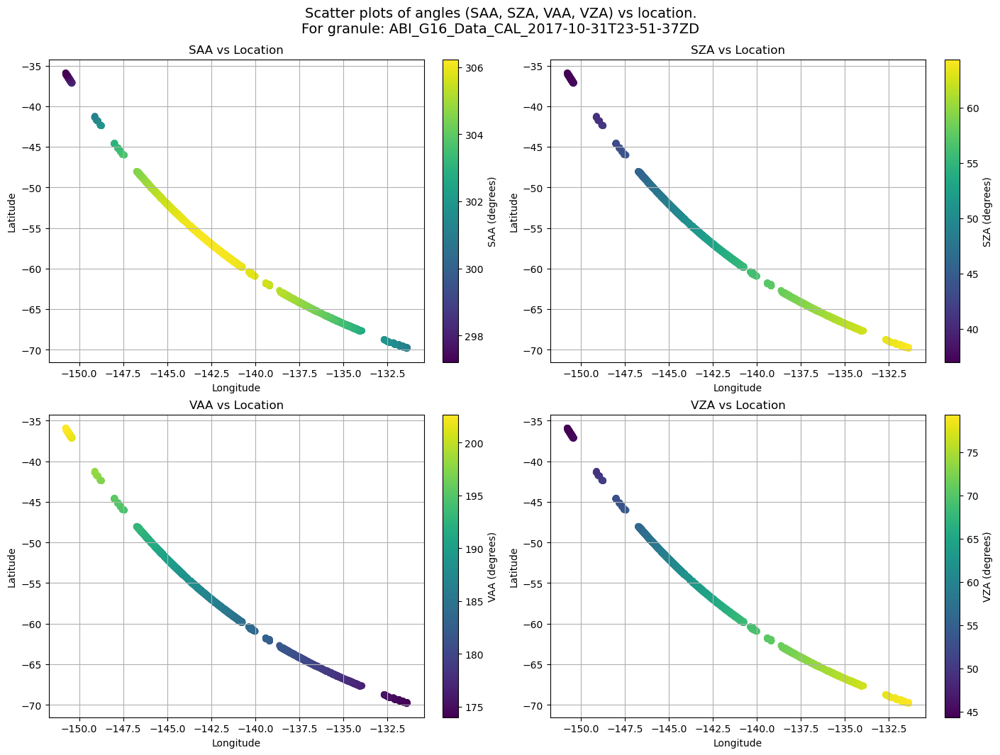

In [11]:

# Combine all angles to calculate a shared colorbar range
angles = [SAA, SZA, VAA, VZA]
valid_angles = np.concatenate([angle[angle != -9999.0] for angle in angles])
vmin, vmax = valid_angles.min(), valid_angles.max()

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(14, 10), constrained_layout=True)

# Titles for subplots
titles = ['SAA', 'SZA', 'VAA', 'VZA']

# Plot each angle in a subplot with its own colorbar
for ax, angle, title in zip(axs.ravel(), angles, titles):
    valid_mask = angle != -9999.0
    scatter = ax.scatter(
        longitude[valid_mask], latitude[valid_mask],
        c=angle[valid_mask], cmap='viridis'
    )
    ax.set_title(f'{title} vs Location')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.grid(True)

    # Add a colorbar for each subplot
    cbar = plt.colorbar(scatter, ax=ax)
    cbar.set_label(f'{title} (degrees)')
    
fig.suptitle(
    "Scatter plots of angles (SAA, SZA, VAA, VZA) vs location.\n"
    "For granule: ABI_G16_Data_CAL_2017-10-31T23-51-37ZD",
    fontsize=14, y=1.05
)

plt.show()

In [19]:
collocated_angles_path = '/Volumes/MyPassport/2017_collocation/ABI_CALIOP_collocated_angles/'
angle_files = sorted(glob.glob(collocated_angles_path+'*.h5'))
angle_files = angle_files[1:19]

latitude_all = []
longitude_all = []
SAA_all = []
SZA_all = []
VAA_all = []
VZA_all = []
time_stamp_all = []

for file in angle_files:
    fd = h5py.File(file,'r')
    latitude = fd['ABI_Lat_1km'][:]
    longitude = fd['ABI_Lon_1km'][:]
    SAA = fd['ABI_Solar_Azimuth_Angle'][:]
    SZA = fd['ABI_Solar_Zenith_Angle'][:]
    VAA = fd['ABI_Sensor_Azimuth_Angle'][:]
    VZA = fd['ABI_Sensor_Zenith_Angle'][:]
    time_stamp = fd['ABI_Timeflag'][:]
    latitude_all.append(latitude)
    longitude_all.append(longitude)
    SAA_all.append(SAA)
    SZA_all.append(SZA)
    VAA_all.append(VAA)
    VZA_all.append(VZA)
    time_stamp_all.append(time_stamp)
longitude_all = np.concatenate(longitude_all)
latitude_all = np.concatenate(latitude_all)
SAA_all = np.concatenate(SAA_all)
SZA_all = np.concatenate(SZA_all)
VAA_all = np.concatenate(VAA_all)
VZA_all = np.concatenate(VZA_all)
time_stamp_all = np.concatenate(time_stamp_all)

In [ ]:
# # Calculate the distance to the target location
# target_lon = -60.0
# target_lat = -40.0

# distances = np.sqrt((longitude_all - target_lon)**2 + (latitude_all - target_lat)**2)
# closest_index = np.argmin(distances)

# # Retrieve the VZA value at the closest location
# closest_VZA = VZA_all[closest_index]
# closest_VAA = VAA_all[closest_index]

In [ ]:
# valid_mask_VZA = VZA_all != -9999.0
# valid_mask_VAA = VAA_all != -9999.0
# valid_mask_SZA = SZA_all != -9999.0
# valid_mask_SAA = SAA_all != -9999.0
# # angle_valid = angle[valid_mask]

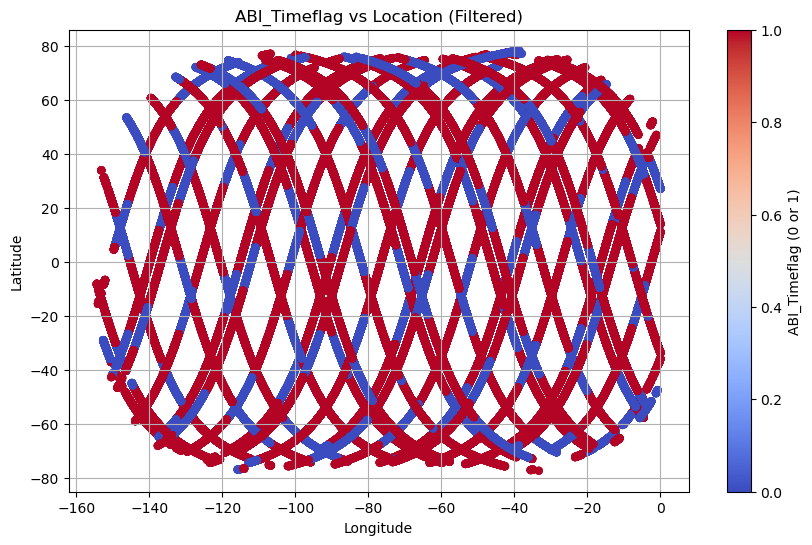

In [16]:

# Transform ABI_Timeflag into binary values
ABI_Timeflag_binary = np.where(time_stamp_all > 0, 1, 0)

# Define the longitude and latitude range
lon_min, lon_max = -160, 0
lat_min, lat_max = -80, 80

# Create a mask for the specified longitude and latitude range
mask = (longitude_all >= lon_min) & (longitude_all <= lon_max) & \
       (latitude_all >= lat_min) & (latitude_all <= lat_max)

# Apply the mask to filter data
filtered_longitude = longitude_all[mask]
filtered_latitude = latitude_all[mask]
filtered_ABI_Timeflag_binary = ABI_Timeflag_binary[mask]

# Plot the filtered data
plt.figure(figsize=(10, 6))
scatter = plt.scatter(
    filtered_longitude, filtered_latitude,
    c=filtered_ABI_Timeflag_binary, cmap='coolwarm', edgecolor='none'
)
plt.colorbar(scatter, label='ABI_Timeflag (0 or 1)')
plt.title('ABI_Timeflag vs Location (Filtered)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)
plt.show()

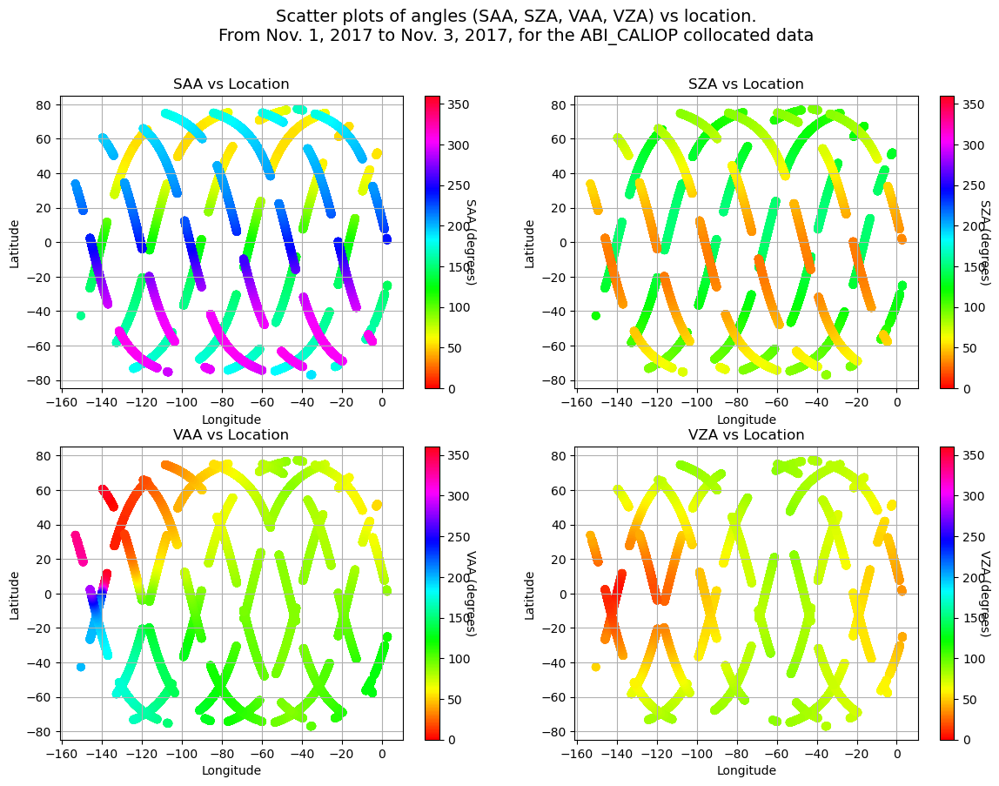

In [20]:
# Prepare data and colormap
angles = [SAA_all, SZA_all, VAA_all, VZA_all]
titles = ['SAA', 'SZA', 'VAA', 'VZA']

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(14, 10))
fig.subplots_adjust(top=0.85)

# Plot each angle in a subplot with a circular colormap
for ax, angle, title in zip(axs.ravel(), angles, titles):
    valid_mask = angle != -9999.0
    angle_valid = angle[valid_mask]
    
    # Normalize to [0, 1] for circular colormap
    norm = Normalize(vmin=0, vmax=360)  # Adjust to the appropriate angle range
    scatter = ax.scatter(
        longitude_all[valid_mask], latitude_all[valid_mask],
        c=angle_valid, cmap='hsv', norm=norm
    )
    ax.set_title(f'{title} vs Location')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.grid(True)

    # Add a circular colorbar for each subplot
    cbar = plt.colorbar(scatter, ax=ax)
    cbar.set_label(f'{title} (degrees)', rotation=270)

# Add a caption for the plot
fig.suptitle(
    "Scatter plots of angles (SAA, SZA, VAA, VZA) vs location.\n"
    "From Nov. 1, 2017 to Nov. 3, 2017, for the ABI_CALIOP collocated data",
    fontsize=14, y=0.95
)

plt.show()

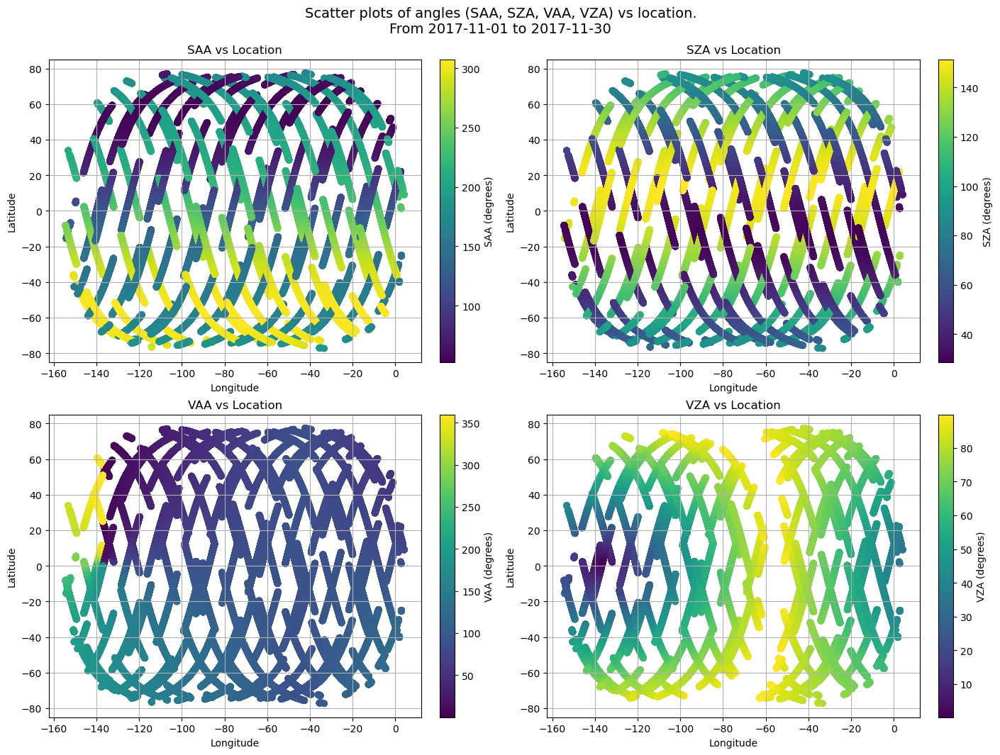

In [ ]:
# Night-time track: from NE TO SW, SZA greater than 90  
# For model training on ABI: remove night-time data if we only use visible channels;
# If using both visible & infrared channels, keep all data
# For CALIPSO it's okay

# Combine all angles to calculate a shared colorbar range
angles = [SAA_all, SZA_all, VAA_all, VZA_all]
valid_angles = np.concatenate([angle[angle != -9999.0] for angle in angles])
vmin, vmax = valid_angles.min(), valid_angles.max()

# Create subplots
fig, axs = plt.subplots(2, 2, figsize=(14, 10), constrained_layout=True)

# Titles for subplots
titles = ['SAA', 'SZA', 'VAA', 'VZA']

# Plot each angle in a subplot with its own colorbar
for ax, angle, title in zip(axs.ravel(), angles, titles):
    valid_mask = angle != -9999.0
    scatter = ax.scatter(
        longitude_all[valid_mask], latitude_all[valid_mask],
        c=angle[valid_mask], cmap='viridis'
    )
    ax.set_title(f'{title} vs Location')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.grid(True)

    # Add a colorbar for each subplot
    cbar = plt.colorbar(scatter, ax=ax)
    cbar.set_label(f'{title} (degrees)')
    
fig.suptitle(
    "Scatter plots of angles (SAA, SZA, VAA, VZA) vs location.\n"
    "From 2017-11-01 to 2017-11-30",
    fontsize=14, y=1.05
)

plt.show()